# Script to make Figure 1

### all the imports

In [1]:
%matplotlib notebook
import rasterio as rio
from rasterio import plot
from rasterio import warp
from rasterio.enums import ColorInterp
from rasterio.windows import Window
from rasterio.transform import TransformMethodsMixin
import os
from os import listdir, makedirs
from os.path import isfile, join, exists
# needed to set environment variables to make it work
os.environ["GDAL_DATA"] = "/home/parndt/anaconda3/envs/geo_py37/share/gdal"
os.environ["PROJ_LIB"] = "/home/parndt/anaconda3/envs/geo_py37/share/proj"
import pandas as pd
import geopandas as gpd
import numpy as np
import earthpy as et
import earthpy.spatial as es
from scipy import interpolate
from scipy.ndimage import gaussian_filter
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pickle as pkl
from mpl_toolkits.basemap import Basemap
from readers.read_HDF5_ATL03 import read_HDF5_ATL03
from readers.read_ICESat2_ATL06 import read_HDF5_ATL06
from readers.get_ATL03_x_atc_corrected import get_ATL03_x_atc_corrected
import warnings
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)
warnings.filterwarnings("ignore",category=RuntimeWarning)
from matplotlib.ticker import FormatStrFormatter
from curve_intersect import *
import shapely
from descartes import PolygonPatch
from matplotlib.collections import PatchCollection

### load ICESat-2 and algorithm data

In [2]:
with open('data/allCompiledData.pkl', 'rb') as handle:
    is2data = pkl.load(handle)
ponds = list(is2data)[:-1]
dfdepth = is2data['depth_all_df']

### get ATL03 from original file for the full ground track over the scene

In [3]:
data_dir = 'data/ATL03h5v003/'
atl06file = 'ATL06_20190102184312_00810210_003_01.h5'
beam = 'gt2l'
IS2_atl06_mds, IS2_atl06_attrs, IS2_atl06_beams = read_HDF5_ATL06(data_dir+atl06file)
data06 = IS2_atl06_mds[beam]
lat_gt = data06['land_ice_segments']['latitude']
lon_gt = data06['land_ice_segments']['longitude']
keep = (lat_gt > -75) & (lat_gt < 70)
lat_gt = lat_gt[keep]
lon_gt = lon_gt[keep]

### plot Sentinel-2 scene with photon data and ATL06 elevations

<IPython.core.display.Javascript object>


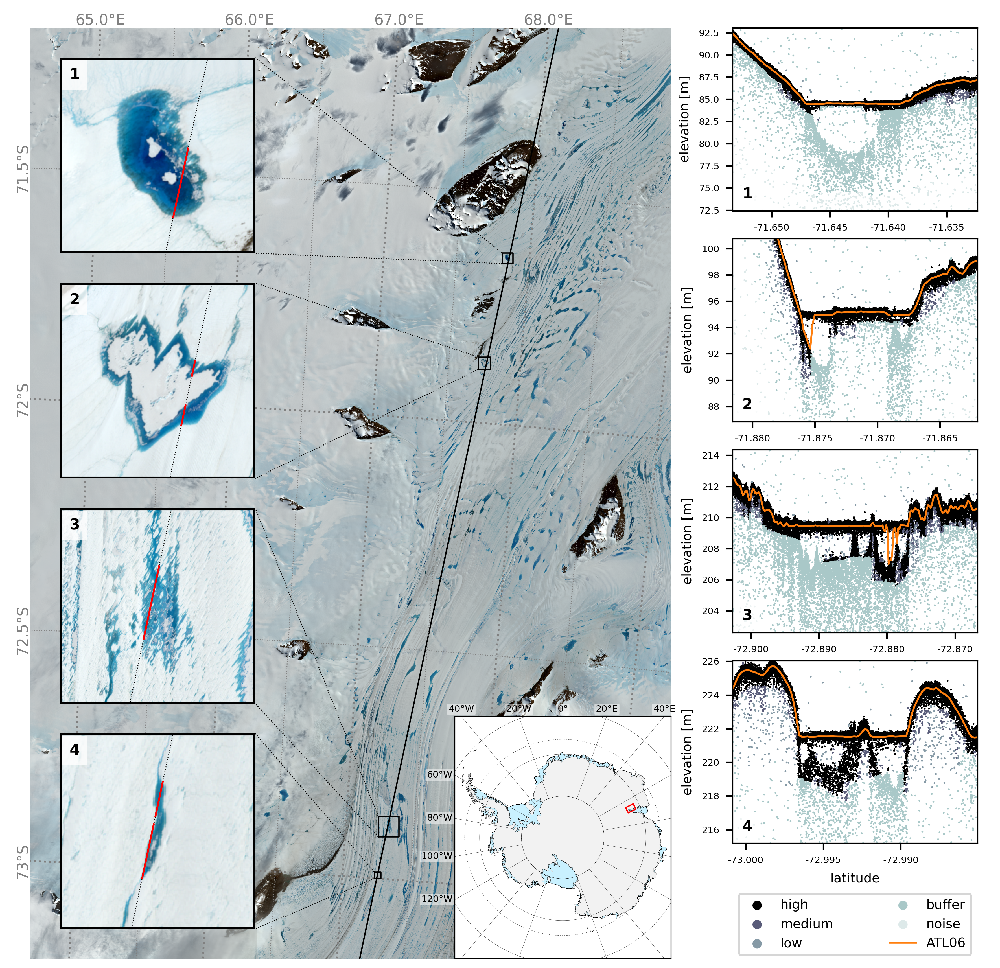

CPU times: user 8.81 s, sys: 1.7 s, total: 10.5 s
Wall time: 8.27 s


In [4]:
%%time

# saves figure at 300 dpi 
hi_res_output = True
# specify figure width
fig_width = 7.5

# colors and descriptions for photon confidences
confs = ['noise','buffer','low','medium','high']
cmap = matplotlib.cm.get_cmap('bone')
confcols = cmap(np.linspace(0.9,0,5))
confcols = cmap([0.9,0.75,0.6,0.4,0])

# limits in Sentinel-2 scene CRS
xl = [555000.0, 709800.0]
yl = [1875220.0, 2100000.0]

# figure arrangement quantities
map_aspect = (xl[1]-xl[0]) / (yl[1]-yl[0])
fig_height = (2/3) * fig_width / map_aspect
fig_aspect = fig_width / fig_height
mapmar_r = 0.01
mapmar_l = 0.03
mapmar_b = mapmar_r / fig_aspect
mapmar_t = mapmar_l / fig_aspect
map_h = 1 - mapmar_t - mapmar_b
map_w = map_h * map_aspect / fig_aspect

# load a Sentinel-2 image for georeferencing info
imgfn = 'data/sentinel2/truecolor/SentinelTrueColor13_small.tiff'
refImg = rio.open(imgfn)
# get bounding box for imagery scene in lat/lon
bb = warp.transform(refImg.crs,{'init': 'epsg:4326'}, [xl[0],xl[0],xl[1],xl[1],xl[0]], [yl[0],yl[1],yl[1],yl[0],yl[0]])

# create figure
if hi_res_output:
    fig = plt.figure(figsize=[fig_width, fig_height], dpi=300)
else:
    fig = plt.figure(figsize=[fig_width, fig_height])
    
##############################################################################
### IMAGERY SCENE
##############################################################################
# create axes for the imagery scene / map
ax=fig.add_axes([mapmar_l, mapmar_b, map_w, map_h])

# plot all tiles in the scene (downscaled truecolor images)
for tilenum in [9,8,10,11,12,13]:
    imgfn = 'data/sentinel2/truecolor/SentinelTrueColor%d_small.tiff' % tilenum
    thisImg = rio.open(imgfn)
    plot.show(thisImg)

# plot ICESat-2 ground track in imagery CRS coordinates
gt_transf = warp.transform({'init': 'epsg:4326'}, refImg.crs, lon_gt, lat_gt)
ax.plot(gt_transf[0], gt_transf[1], 'k-', lw=0.75)

# plot meridians and parallels
meridians = np.arange(60.0,72.0, step=0.5)
parallels = np.arange(-75.0,-70.0, step=0.5)
latseq = np.linspace(-75.0,-70,200)
lonseq = np.linspace(62.0,70.0,200)
gridcol = 'gray'
gridls = ':'
gridlw = 0.5
topline = [[xl[0],xl[1]],[yl[1],yl[1]]]
leftline = [[xl[0],xl[0]],[yl[0],yl[1]]]
for me in meridians:
    gr_trans = warp.transform({'init': 'epsg:4326'},refImg.crs,me*np.ones_like(latseq),latseq)
    if np.round(me,1) % 1 == 0:
        thislw = gridlw * 2
        intx,inty = intersection(topline[0], topline[1], gr_trans[0], gr_trans[1])
        if len(intx) > 0:
            intx = intx[0]
            inty = inty[0]
            deglab = '%.1f°E' % me
            ax.text(intx, inty, deglab, fontsize=8, color='gray',verticalalignment='bottom',horizontalalignment='center')
    else:
        thislw = gridlw
    ax.plot(gr_trans[0],gr_trans[1],c=gridcol,ls=gridls,lw=thislw)
for pa in parallels:
    gr_trans = warp.transform({'init': 'epsg:4326'},refImg.crs,lonseq,pa*np.ones_like(lonseq))
    if np.round(pa,1) % 1 == 0:
        thislw = gridlw * 2
        deglab = '%d°S' % np.abs(pa)
    else:
        thislw = gridlw
        deglab = '%.1f°S' % np.abs(pa)
    intx,inty = intersection(leftline[0], leftline[1], gr_trans[0], gr_trans[1])
    if len(intx) > 0:
        intx = intx[0]
        inty = inty[0]
        ax.text(intx, inty, deglab, fontsize=8, color='gray',verticalalignment='center',horizontalalignment='right',
                rotation='vertical')
    ax.plot(gr_trans[0],gr_trans[1],c=gridcol,ls=gridls,lw=thislw)

# set limits 
ax.set_xlim(xl)
ax.set_ylim(yl)
ax.axis('off')

##############################################################################
### INSET MAP
##############################################################################
# get low-resolution REMA for inset map
# imgfn = 'data/REMA/REMA_1km_dem_filled.tiff'
# thisImg = rio.open(imgfn)
# data = thisImg.read(1)
# nodata = tuple([data==-9999.0])
# data[nodata] = 0
# smoothrema = gaussian_filter(data,sigma=15)
# hillshade = es.hillshade(smoothrema,azimuth=-30,altitude=30)
# hillshade[nodata] = np.nan

gz_sio = gpd.read_file("data/siogz/scripps_antarctica_polygons_v1.shp")
gz_sio_latlon = gz_sio.to_crs(epsg=4326)

# create inset map of Antarctica on lower right of imagery scene axes
map_height = 0.26
ratio_hw = 1.12 #need this to cover up the area where imagery is missing in the lower right corner
map_y = 0.00025
map_width = map_height / map_aspect / ratio_hw
map_x = 1-map_y/map_aspect - map_width
axmap = ax.inset_axes([map_x, map_y, map_width, map_height])

# use basemap with polar stereographic projection
lon_0 = 0.
lat_0 = -90.
m=Basemap(width=5700000., height=5700000.*ratio_hw, projection='stere',
          ellps='WGS84', lon_0=lon_0, lat_0=lat_0, lat_ts=-71.,resolution='l',ax=axmap)
# offs = m(lon_0,lat_0)
# ext = [thisImg.bounds.left+offs[0],thisImg.bounds.right+offs[0],thisImg.bounds.bottom+offs[1],thisImg.bounds.top+offs[1]]
# axmap.imshow(hillshade,extent=ext,cmap='gray',vmin=-80, vmax=255)
m.drawparallels([-66.5, 66.5],color='k',linewidth=0.1, dashes=[6,6],fontsize=5)
m.drawparallels([-90,-80,-70,-60],color='k',linewidth=0.1, dashes=[1,0],fontsize=5)
m.drawmeridians(np.arange(-180.,180.,20.),labels=[1,0,1,0],color='k',latmax=80,linewidth=0.1, dashes=[1,0],
                textcolor='k',fontsize=5, bbox=dict(facecolor='white', alpha=0.5,boxstyle='round,pad=0.15',linewidth=0))
x, y = m(bb[0],bb[1])
axmap.plot(x,y,'r-',lw=0.7)
# m.drawcoastlines(linewidth=0.5)

allpatches = []
grounded = gz_sio_latlon[gz_sio_latlon.Id < 4]
shelves = gz_sio_latlon[gz_sio_latlon.Id.eq(4)]
for thing in [grounded, shelves]:
    patches = []
    for poly in thing.geometry:
        if poly.geom_type == 'Polygon':
            mpoly = shapely.ops.transform(m, poly)
            patches.append(PolygonPatch(mpoly))
        elif poly.geom_type == 'MultiPolygon':
            for subpoly in poly:
                mpoly = shapely.ops.transform(m, poly)
                patches.append(PolygonPatch(mpoly))
        else:
            print(poly, "is neither a polygon nor a multi-polygon. Skipping it.")
    allpatches.append(patches)
grounded_plot = axmap.add_collection(PatchCollection(allpatches[0], match_original=True))
grounded_plot.set_facecolor((0.95,0.95,0.95))
grounded_plot.set_linewidth(0.1)
shelves_plot = axmap.add_collection(PatchCollection(allpatches[1], match_original=True))
shelves_plot.set_facecolor((0.78823529, 0.94509804, 1.))
shelves_plot.set_linewidth(0.1)
for side in ['top','bottom','left','right']:
    axmap.spines[side].set_linewidth(0.5)

# spatial stuff for inset axes
pp_height = 0.21
pa_bott = 0.1
pa_height = (1-pa_bott)*pp_height
mid_y_phot = (1-pa_bott-(pa_height*4))/5
mid_y_pond = (1-(pp_height*4))/5
pp_width = pp_height / map_aspect
pp_x = mid_y_pond / map_aspect
buffh = 0.5

mid = [(638935, 1895344), (641574, 1907160), (664747, 2019038), (670308, 2044387)]
wid = [800,2500,1500,1300]
pond_xl, pond_yl = [], []
pond_bb, pond_bb_main = [], []

axis_to_data = ax.transAxes + ax.transData.inverted()
    
for i,pond in enumerate(ponds):
    
    pp_y = (i+1)*mid_y_pond + i*pp_height
    pa_y = pa_bott + (i+1)*mid_y_phot + i*pa_height
    pp_yins = 0.0
    pp_xins = 0.03
    
    ######################################################
    # plot photon data on separate axes next to the imagery 
    axphot = fig.add_axes([mapmar_l+map_w+pp_x+pp_xins/2, pa_y+pp_yins, pp_width-2*pp_xins, pa_height-pp_yins])
    p = is2data[pond]
    surf_h = p['picking']['median_surf_height']
    df = dfdepth[dfdepth.pond.eq(i+1)]
    
#     # ATL03 scatter
#     axphot.scatter(p['atl03_lat'], p['atl03_h'], s=2, c='k', alpha=0.2, edgecolors='none',label='ATL03')
    
    # plot ATL03 with confidences in different colors
    for conf in range(len(confs))[::-1]:
        select_conf = p['atl03_conf_li']==conf
        confcol = confcols[conf,:]
        axphot.scatter(p['atl03_lat'][select_conf], p['atl03_h'][select_conf], s=1, c=[confcol], 
                             alpha=1, edgecolors='none')
        axphot.scatter(0, 0, s=25, c=[confcol], alpha=1, edgecolors='none',label=confs[conf]) # for legend
        
    plot_d = np.full_like(df.manual,fill_value=np.nan)
    for v in np.arange(1,len(df.manual)-1): # to catch edges, just for visualization
        plot_d[v] = 0.01 * df.manual.iloc[v-1] + 0.98 * df.manual.iloc[v] + 0.01 * df.manual.iloc[v+1]
    plot_d[plot_d==0] = np.nan
    plot_d = - plot_d + surf_h
    plot_is2 = -np.abs(np.array(df.med_algorithms))
    plot_is2[plot_is2>-0.1] = np.nan
    plot_is2 += surf_h
    # axphot.plot(df.index,plot_is2,label='ICESat-2 median',lw=0.5,c='r',ls='-')
    axphot.plot(p['atl06_lat'], p['atl06_h'], c='C1', alpha=1, lw=1,ls='-',label='ATL06')
    
    axphot.tick_params(axis='both', which='major', labelsize=7)
    if i == 0:
        axphot.set_xlabel('latitude', size=7)
    axphot.set_ylabel('elevation [m]', size=7)
    axphot.tick_params(axis='both', which='major', labelsize=5)
    xl = - buffh * (p['xlims_plot'][1]-p['xlims_plot'][0]) + p['xlims_plot'][0] 
    xu = buffh * (p['xlims_plot'][1]-p['xlims_plot'][0]) + p['xlims_plot'][1]
    if pond == 'pond2':
        xt = np.arange(np.round(xl-0.01,2),np.round(xu+0.01,2),step=0.01)
    else:
        xt = np.arange(np.round(xl-0.01,2),np.round(xu+0.01,2),step=0.005)
    axphot.xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    axphot.set_xticks(xt)
    axphot.set_xlim((xl,xu))
    mx = np.nanmax(plot_d)
    mn = np.nanmin(plot_d)
    rng = mx-mn
    axphot.set_ylim(mn-1*rng, mx+1.4*rng)
    props = dict(facecolor='white', alpha=0.8, linewidth=0)
    axphot.text(0.04,0.05,'%d' % (4-i),transform = axphot.transAxes,verticalalignment='bottom',horizontalalignment='left',
               fontsize=8, fontweight='bold', bbox=props)
    if i == 3:
        handles_data, labels_data = axphot.get_legend_handles_labels()
    
    ######################################################
    # plot pond images
    axpond = ax.inset_axes([pp_x, pp_y, pp_width, pp_height])
    
    imgfn = 'data/sentinel2/ponds/%s_alt.tiff' % pond
    thisPondImg = rio.open(imgfn)
    
    xb = (mid[i][0]-wid[i], mid[i][0]+wid[i])
    yb = (mid[i][1]-wid[i], mid[i][1]+wid[i])
    pond_bb.append(([xb[0],xb[0],xb[1],xb[1],xb[0]], [yb[0],yb[1],yb[1],yb[0],yb[0]]))
    pond_bb_main.append(warp.transform(thisPondImg.crs, refImg.crs, pond_bb[i][0], pond_bb[i][1]))
    pond_xl.append(xb)
    pond_yl.append(yb)
    
    #plot.show(thisPondImg,ax=axpond)
    # rgb = np.zeros((thisPondImg.height,thisPondImg.width,thisPondImg.count))
    rgb = np.zeros((thisPondImg.count,thisPondImg.height,thisPondImg.width))
    for j in range(thisPondImg.count):
        rgb[j,:,:] = np.power(thisPondImg.read(j+1)/255,0.7)
    plot.show(rgb,ax=axpond,transform=thisPondImg.transform)
    dflonlat = pd.DataFrame(list(zip(is2data[pond]['atl06_lat'],is2data[pond]['atl06_lon'])),columns=['lat','lon'])
    dflonlat.sort_values(by='lat',inplace=True)
    gt_coords = warp.transform({'init': 'epsg:4326'}, thisPondImg.crs, dflonlat.lon, dflonlat.lat)
    axpond.plot(gt_coords[0],gt_coords[1],'k:',lw=0.5)
    
    pondlats = np.array(df.index)
    pondlons = np.interp(pondlats,dflonlat.lat,dflonlat.lon, left=np.nan, right=np.nan)
    pondlats[np.isnan(plot_is2)] = np.nan
    pondlats[np.isnan(plot_is2)] = np.nan
    gt_plot = warp.transform({'init': 'epsg:4326'}, thisPondImg.crs, pondlons, pondlats)
    axpond.plot(gt_plot[0],gt_plot[1],'r-',lw=1)
    
#     lat_plot = is2data[pond]['xlims_plot']
#     lon_plot = np.interp(lat_plot,dflonlat.lat,dflonlat.lon, left=np.nan, right=np.nan)
#     gt_plot = warp.transform({'init': 'epsg:4326'}, thisPondImg.crs, lon_plot, lat_plot)
#     axpond.plot(gt_plot[0],gt_plot[1],'r-',lw=1)
    
    axpond.set_xlim(pond_xl[i])
    axpond.set_ylim(pond_yl[i])
    axpond.axis('off')
    axpond.axis(edgecolor='k')
    props = dict(facecolor='white', alpha=0.8, linewidth=0)
    axpond.text(0.05,0.95,'%d' % (4-i),transform = axpond.transAxes,verticalalignment='top',horizontalalignment='left',
               fontsize=8, fontweight='bold', bbox=props)
    
    # plot extent for each pond on main image
    axpond.plot(pond_bb[i][0], pond_bb[i][1],'k-',lw=2)
    ax.plot(pond_bb_main[i][0], pond_bb_main[i][1],'k-',lw=0.7)
    
    points_data = axis_to_data.transform((pp_x + pp_width, pp_y))
    ax.plot((pond_bb_main[i][0][0],points_data[0]), (pond_bb_main[i][1][0],points_data[1]),'k:',lw=0.5)
    points_data = axis_to_data.transform((pp_x + pp_width, pp_y + pp_height))
    ax.plot((pond_bb_main[i][0][1],points_data[0]), (pond_bb_main[i][1][1],points_data[1]),'k:',lw=0.5)

# lgc = (mapmar_l+map_w+pp_x+pp_xins/2 + (pp_width-2*pp_xins)/2, pa_bott/2)
# plt.legend(handles_data, labels_data,loc='center',bbox_to_anchor=lgc,bbox_transform=fig.transFigure,fontsize=7,ncol=2)
lgc = ((mapmar_l+map_w+pp_x+pp_xins/2), 0.01, pp_width-2*pp_xins, pa_bott-0.03)
plt.legend(handles_data[1:]+[handles_data[0]], labels_data[1:]+[labels_data[0]],loc='center',
           bbox_to_anchor=lgc,bbox_transform=fig.transFigure,fontsize=7,ncol=2,mode='expand')

if hi_res_output:
    plt.savefig('figs/Fig1_amery_melt_map_photons.png')